Test LSTM Architecture for Rebuilding Joint Angles from Current, Speed, and Temperature Data

In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import combinations
import warnings
import streamlit as st
import glob
import os

# Code GPT 5.1 11-21-25
def rebase_time_gaps(df, time_col='time', gap_threshold=2.0, reset_gap=0.01):
    """
    Rebases timestamps when gaps exceed a threshold.
    
    Parameters:
        df : pd.DataFrame
            Must contain a numeric or datetime time column.
        time_col : str
            Name of the time column.
        gap_threshold : float
            Threshold (in seconds) for gap detection.
        reset_gap : float
            Gap to insert after rebasing (in seconds).
    Returns:
        pd.DataFrame with continuous time column.
    """
    df = df.copy()
    
    # Convert to numeric seconds if datetime
    if not pd.api.types.is_numeric_dtype(df[time_col]):
        df[time_col] = pd.to_datetime(df[time_col])
        df[time_col] = (df[time_col] - df[time_col].iloc[0]).dt.total_seconds()
    
    # Sort by time
    df = df.sort_values(time_col).reset_index(drop=True)
    
    # Detect large gaps
    time_vals = df[time_col].to_numpy()
    gaps = np.diff(time_vals)
    
    # Keep track of total offset applied
    offset = 0.0
    adjusted_times = [time_vals[0]]
    
    for i, gap in enumerate(gaps, start=1):
        if gap > gap_threshold:
            # Increase offset by the size of the gap minus desired reset gap
            offset += (gap - reset_gap)
        adjusted_times.append(time_vals[i] - offset)
    
    df[time_col] = adjusted_times
    return df


def aursad_data():
    data_path = "../data/aursad"

    # Get all feather files, sorted in order (important for time series)
    feather_files = sorted(glob.glob(os.path.join(data_path, "part_*.feather")))

    # Load and concatenate
    start = 0
    stop = 75
    df_aursad = pd.concat([pd.read_feather(f) for f in feather_files[start:stop]], ignore_index=True)

    df_aursad = df_aursad.rename(columns={'timestamp': 'time'})
    df_aursad['time'] = df_aursad['time'] - df_aursad['time'].min()
    df_aursad = df_aursad.sort_values('time').reset_index(drop=True)
    df_aursad = rebase_time_gaps(df_aursad, time_col='time', gap_threshold=2.0, reset_gap=0.01)

    # Downsample
    # df_aursad = df_aursad.iloc[::200]

    # Renaming to match CobotOps
    for i in range(6):
        df_aursad = df_aursad.rename(columns={f'actual_current_{i}': f'Current{i}'})
        df_aursad = df_aursad.rename(columns={f'actual_qd_{i}': f'Speed{i}'})
        df_aursad = df_aursad.rename(columns={f'joint_temperatures_{i}': f'Temperature{i}'})

    # simplify joint angle names
    for i in range(6):
        df_aursad = df_aursad.rename(columns={f'actual_q_{i}': f'q{i}'})

    # Encode labels for screwing failures
    df_aursad = pd.get_dummies(df_aursad, columns=['label'], prefix='label')
    label_names = ["Normal operation", "Damaged screw", "Extra assembly component", "Missing screw", "Damaged thread samples", "Screw Loosening"]

    for i, label in enumerate(label_names):
        df_aursad = df_aursad.rename(columns={f'label_{i}': label})
    df_aursad.head()

    return df_aursad

# df = aursad_data()
# df.to_feather('../data/aursad/aursad_training.feather')

df = pd.read_feather('../data/aursad/aursad_training.feather')

In [18]:
df.head()

,sample_nr,time,target_q_0,target_q_1,target_q_2,target_q_3,target_q_4,target_q_5,target_qd_0,target_qd_1,...,output_bit_register_67,output_bit_register_70,output_bit_register_71,output_bit_register_72,Normal operation,Damaged screw,Extra assembly component,Missing screw,Damaged thread samples,Screw Loosening
0,3431,0.00,0.083315,-1.084336,1.301481,-0.186469,-0.041835,-1.601735,0.0,0.0,...,False,False,False,False,False,False,False,False,False,True
1,3431,0.01,0.083315,-1.084336,1.301481,-0.186469,-0.041835,-1.601735,0.0,0.0,...,False,False,False,False,False,False,False,False,False,True
2,3431,0.02,0.083315,-1.084336,1.301481,-0.186469,-0.041835,-1.601735,0.0,0.0,...,False,False,False,False,False,False,False,False,False,True
3,3431,0.03,0.083315,-1.084336,1.301481,-0.186469,-0.041835,-1.601735,0.0,0.0,...,False,False,False,False,False,False,False,False,False,True
4,3431,0.04,0.083315,-1.084336,1.301481,-0.186469,-0.041835,-1.601735,0.0,0.0,...,False,False,False,False,False,False,False,False,False,True


In [2]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset, random_split
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------
# Model Definition
# -----------------------------
class RobotLSTM(nn.Module):
    def __init__(self, input_size=18, hidden_size=128, output_size=6, num_layers=2):
        super(RobotLSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True, dropout=0.2)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out)
        return out

Epoch [1/100] | Train Loss: 0.19818 | Val Loss: 0.11698
Saved best model
Epoch [2/100] | Train Loss: 0.10890 | Val Loss: 0.09073
Saved best model
Epoch [3/100] | Train Loss: 0.08693 | Val Loss: 0.06954
Saved best model
Epoch [4/100] | Train Loss: 0.07561 | Val Loss: 0.07297
Epoch [5/100] | Train Loss: 0.06571 | Val Loss: 0.05188
Saved best model
Epoch [6/100] | Train Loss: 0.05894 | Val Loss: 0.04976
Saved best model
Epoch [7/100] | Train Loss: 0.05448 | Val Loss: 0.04391
Saved best model
Epoch [8/100] | Train Loss: 0.05145 | Val Loss: 0.04075
Saved best model
Epoch [9/100] | Train Loss: 0.04749 | Val Loss: 0.04502
Epoch [10/100] | Train Loss: 0.04779 | Val Loss: 0.03838
Saved best model
Epoch [11/100] | Train Loss: 0.04397 | Val Loss: 0.03908
Epoch [12/100] | Train Loss: 0.04202 | Val Loss: 0.06067
Epoch [13/100] | Train Loss: 0.04027 | Val Loss: 0.03182
Saved best model
Epoch [14/100] | Train Loss: 0.03868 | Val Loss: 0.04113
Epoch [15/100] | Train Loss: 0.03925 | Val Loss: 0.03138
S

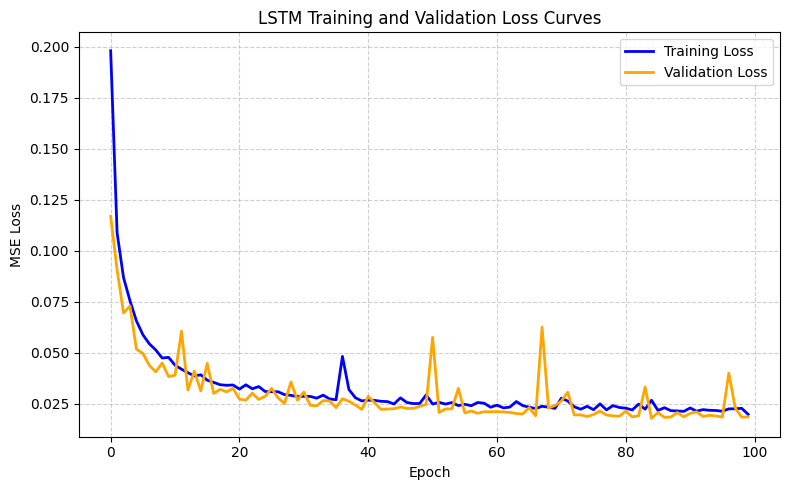

Predicted joint angles shape: torch.Size([1, 50, 6])


: 

In [ ]:
# -----------------------------
# AURSAD Data
# -----------------------------
seq_len = 50
input_size = 18
output_size = 6

X = df[['actual_qd_0', 'actual_qd_1', 'actual_qd_2', 'actual_qd_3', 'actual_qd_4', 'actual_qd_5', 
        'Temperature0','Temperature1','Temperature2','Temperature3','Temperature4','Temperature5',
        'Current0','Current1','Current2','Current3','Current4','Current5']].values
y = df[['q0','q1','q2','q3','q4','q5']].values

num_samples = len(X) // seq_len
X = X[:num_samples * seq_len].reshape(num_samples, seq_len, input_size)
y = y[:num_samples * seq_len].reshape(num_samples, seq_len, output_size)

# Convert to float tensors
X_tensor = torch.tensor(X, dtype=torch.float32)
y_tensor = torch.tensor(y, dtype=torch.float32)

dataset = TensorDataset(X_tensor, y_tensor)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_ds, val_ds = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_ds, batch_size=32, shuffle=True)
val_loader = DataLoader(val_ds, batch_size=32)

# -----------------------------
# Training Setup
# -----------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = RobotLSTM(input_size, 128, output_size, 2).to(device)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

# -----------------------------
# Training Loop
# -----------------------------
epochs = 100
best_val_loss = float('inf')
train_losses, val_losses = [], []

for epoch in range(epochs):
    model.train()
    train_loss = 0.0

    for X_batch, y_batch in train_loader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)
        optimizer.zero_grad()
        outputs = model(X_batch)
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()

    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for X_val, y_val in val_loader:
            X_val, y_val = X_val.to(device), y_val.to(device)
            preds = model(X_val)
            val_loss += criterion(preds, y_val).item()

    avg_train_loss = train_loss / len(train_loader)
    avg_val_loss = val_loss / len(val_loader)
    train_losses.append(avg_train_loss)
    val_losses.append(avg_val_loss)

    print(f"Epoch [{epoch+1}/{epochs}] | Train Loss: {avg_train_loss:.5f} | Val Loss: {avg_val_loss:.5f}")

    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        torch.save(model.state_dict(), "lstm_robot_model.pt")
        print("Saved best model")

print("Training complete. Best validation loss:", best_val_loss)

# -----------------------------
# Plot Learning Curves
# -----------------------------
plt.figure(figsize=(8,5))
plt.plot(train_losses, label='Training Loss', color='blue', linewidth=2)
plt.plot(val_losses, label='Validation Loss', color='orange', linewidth=2)
plt.title('LSTM Training and Validation Loss Curves')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# -----------------------------
# Load Model for Inference
# -----------------------------
loaded_model = RobotLSTM(input_size, 128, output_size, 2)
loaded_model.load_state_dict(torch.load("lstm_robot_model.pt", map_location=device))
loaded_model.to(device)
loaded_model.eval()

with torch.no_grad():
    test_input = torch.randn(1, seq_len, input_size).to(device)
    pred_angles = loaded_model(test_input)
    print("Predicted joint angles shape:", pred_angles.shape)


In [3]:


seq_len = 50
input_size = 18
output_size = 6

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
loaded_model = RobotLSTM(input_size, 128, output_size, 2)
loaded_model.load_state_dict(torch.load("lstm_robot_model.pt", map_location=device))
loaded_model.to(device)
loaded_model.eval()



X = df[['actual_qd_0', 'actual_qd_1', 'actual_qd_2', 'actual_qd_3', 'actual_qd_4', 'actual_qd_5', 
        'Temperature0','Temperature1','Temperature2','Temperature3','Temperature4','Temperature5',
        'Current0','Current1','Current2','Current3','Current4','Current5',]].values
y = df[['q0','q1','q2','q3','q4','q5']].values

num_samples = len(X) // seq_len
# X = X[:num_samples * seq_len].reshape(num_samples, seq_len, input_size)
# y = y[:num_samples * seq_len].reshape(num_samples, seq_len, output_size)
# X_tensor = torch.tensor(X, dtype=torch.float32)
# y_tensor = torch.tensor(y, dtype=torch.float32)

# -----------------------------
# Load Model for Full Dataset Inference
# -----------------------------
loaded_model = RobotLSTM(input_size, 128, output_size, 2)
loaded_model.load_state_dict(torch.load("lstm_robot_model.pt", map_location=device))
loaded_model.to(device)
loaded_model.eval()

# -----------------------------
# Prepare Data as Sequential Input
# -----------------------------
# Ensure data is reshaped as (num_samples, seq_len, input_size)
num_samples = len(X) // seq_len
X_seq = X[:num_samples * seq_len].reshape(num_samples, seq_len, input_size)

# Convert to tensor
X_seq_tensor = torch.tensor(X_seq, dtype=torch.float32).to(device)

# -----------------------------
# Run Inference on All Sequences
# -----------------------------
predictions = []

with torch.no_grad():
    for batch in X_seq_tensor:
        batch = batch.unsqueeze(0)  # shape (1, seq_len, input_size)
        pred = loaded_model(batch)  # shape (1, seq_len, output_size)
        predictions.append(pred.squeeze(0).cpu().numpy())

# Convert to single 2D array (total_timesteps, output_size)
predictions = np.vstack(predictions)

# -----------------------------
# Save Predictions to DataFrame
# -----------------------------
pred_cols = [f'pred_q{i}' for i in range(output_size)]
pred_df = pd.DataFrame(predictions, columns=pred_cols)

# Trim df to match predictions (in case of leftover rows)
df_pred = df.iloc[:len(pred_df)].copy()
df_pred[pred_cols] = pred_df




In [4]:
# -----------------------------
# Save to file
# -----------------------------
df_pred.to_feather("predicted_joint_angles.feather")

print("Predictions complete.")
print("Saved file: predicted_joint_angles.csv")
print("DataFrame shape:", df_pred.shape)
print(df_pred.head())

Predictions complete.
Saved file: predicted_joint_angles.csv
DataFrame shape: (6249050, 145)
   sample_nr  time  target_q_0  target_q_1  target_q_2  target_q_3  \
0       3431  0.00    0.083315   -1.084336    1.301481   -0.186469   
1       3431  0.01    0.083315   -1.084336    1.301481   -0.186469   
2       3431  0.02    0.083315   -1.084336    1.301481   -0.186469   
3       3431  0.03    0.083315   -1.084336    1.301481   -0.186469   
4       3431  0.04    0.083315   -1.084336    1.301481   -0.186469   

   target_q_4  target_q_5  target_qd_0  target_qd_1  ...  \
0   -0.041835   -1.601735          0.0          0.0  ...   
1   -0.041835   -1.601735          0.0          0.0  ...   
2   -0.041835   -1.601735          0.0          0.0  ...   
3   -0.041835   -1.601735          0.0          0.0  ...   
4   -0.041835   -1.601735          0.0          0.0  ...   

   Extra assembly component  Missing screw  Damaged thread samples  \
0                     False          False             

In [6]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

def time_series_plots(df, error=None):
    feature_type_lst = ["q0", "q1", "q2", "q3", "q4", "q5"]
    colors = px.colors.qualitative.Dark24[:6]

    # Create subplots for X, Y, Z
    fig = make_subplots(
        rows=6, cols=1,
        shared_xaxes=True,
        subplot_titles=(feature_type_lst),
        vertical_spacing=0.08
    )

    # Loop through each axis
    for idx, feature_type in enumerate(feature_type_lst, start=1):
        color = colors[idx - 1]

        # Plot original position
        if feature_type in df.columns:
            fig.add_trace(
                go.Scatter(
                    x=df['time'],
                    y=df[feature_type],
                    name=f"{feature_type.upper()} (true)",
                    mode='lines',
                    line=dict(color=color, width=2),
                ),
                row=idx, col=1
            )

        # Plot reconstructed / predicted position
        hat_col = f"pred_{feature_type}"
        if hat_col in df.columns:
            fig.add_trace(
                go.Scatter(
                    x=df['time'],
                    y=df[hat_col],
                    name=f"{feature_type.upper()} (pred)",
                    mode='lines',
                    line=dict(color=color, width=2, dash='dash')
                ),
                row=idx, col=1
            )

    # Optional: error shading or line
    if error is not None and "time" in df.columns:
        fig.add_trace(
            go.Scatter(
                x=df['time'],
                y=error,
                name="Error",
                mode='lines',
                line=dict(color='red', dash='dot')
            ),
            row=3, col=1
        )

    # Axis titles
    fig.update_xaxes(title_text="Time (s)", row=6, col=1, rangeslider_visible=True)
    for i, feature_type in enumerate(feature_type_lst, start=1):
        fig.update_yaxes(title_text=f"{feature_type.upper()} (m)", row=i, col=1)

    # Layout
    fig.update_layout(
        height=1000,
        title_text="Joint Angle Reconstruction via LSTM",
        legend=dict(orientation="h", yanchor="bottom", y=1.0, xanchor="right", x=1)
    )

    return fig

# Example usage
fig = time_series_plots(df_pred.iloc[::100])
fig.show()

In [7]:
import torch
import pandas as pd


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
loaded_model = RobotLSTM(input_size, 128, output_size, 2)
loaded_model.load_state_dict(torch.load("lstm_robot_model.pt", map_location=device))
loaded_model.to(device)
loaded_model.eval()

seq_len = 50
input_size = 18
output_size = 6


df_cobots = pd.read_feather('../data/cobotops/cobotops.feather')
X = df_cobots[['Speed0', 'Speed1', 'Speed2', 'Speed3', 'Speed4', 'Speed5', 
        'Temperature0','Temperature1','Temperature2','Temperature3','Temperature4','Temperature5',
        'Current0','Current1','Current2','Current3','Current4','Current5',]].values

# -----------------------------
# Prepare Data as Sequential Input
# -----------------------------
# Ensure data is reshaped as (num_samples, seq_len, input_size)
num_samples = len(X) // seq_len
X_seq = X[:num_samples * seq_len].reshape(num_samples, seq_len, input_size)

# Convert to tensor
X_seq_tensor = torch.tensor(X_seq, dtype=torch.float32).to(device)

# -----------------------------
# Run Inference on All Sequences
# -----------------------------
predictions = []

with torch.no_grad():
    for batch in X_seq_tensor:
        batch = batch.unsqueeze(0)  # shape (1, seq_len, input_size)
        pred = loaded_model(batch)  # shape (1, seq_len, output_size)
        predictions.append(pred.squeeze(0).cpu().numpy())

# Convert to single 2D array (total_timesteps, output_size)
predictions = np.vstack(predictions)

# -----------------------------
# Save Predictions to DataFrame
# -----------------------------
pred_cols = [f'q{i}' for i in range(output_size)]
pred_df = pd.DataFrame(predictions, columns=pred_cols)

# Trim df to match predictions (in case of leftover rows)
df_pred = df_cobots.iloc[:len(pred_df)].copy()
df_pred[pred_cols] = pred_df

# Example usage
fig = time_series_plots(df_pred.iloc[::100])
fig.show()

In [ ]:
# Ensure both DataFrames have the same index length
df_merged = pd.concat([df_cobots.reset_index(drop=True),
                       df_pred.reset_index(drop=True)],
                      axis=1)

# Remove any duplicate columns that might appear
df_merged = df_merged.loc[:, ~df_merged.columns.duplicated()]

print("Combined DataFrame created with all unique columns.")
print("Final shape:", df_merged.shape)
print("Sample columns:", df_merged.columns.tolist())

# save
df_merged.to_feather("../data/cobotops/cobot_ops_added_q.feather")


Combined DataFrame created with all unique columns.
Final shape: (7409, 29)
Sample columns: ['Current0', 'Current1', 'Current2', 'Current3', 'Current4', 'Current5', 'Robot_ProtectiveStop', 'Speed0', 'Speed1', 'Speed2', 'Speed3', 'Speed4', 'Speed5', 'Temperature0', 'Temperature1', 'Temperature2', 'Temperature3', 'Temperature4', 'Temperature5', 'Tool_current', 'cycle', 'grip_lost', 'time', 'q0', 'q1', 'q2', 'q3', 'q4', 'q5']
